In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
sns.set()
from matplotlib.dates import DateFormatter
# -----------------------------------------------------------------------------------
# Load the patient level table
# -----------------------------------------------------------------------------------
root_direc = "H:/Research/Hand_dirty/SAH_data"
patient = pd.read_csv(
        root_direc+"/patient_encounter/Pat_file_ENC.csv")
patient['PATIENT_SK'].nunique()                      # 4810
SAH_ENC_screened_24h_rule = pd.read_csv(
  root_direc+"/patient_encounter/SAH_ENC_screened_24h_rule.csv")
SAH_ENC_screened_24h_rule['PATIENT_SK'].nunique()    # 4810
SAH_ENC_screened_24h_rule['ENCOUNTER_ID'].nunique()  # 4823
SAH_ENC_screened_24h_rule.shape
# Get a new patient level table by adding information such as encounter ID
pat_enc_final = pd.merge(patient, SAH_ENC_screened_24h_rule, on='PATIENT_SK')
pat_enc_final.shape

# -----------------------------------------------------------------------------------
# Prepare the medication table
# -----------------------------------------------------------------------------------

pd.options.display.max_rows = 200
enc_med_cl2 = pd.read_csv(
   root_direc+'/medication/sah_pts_enc_med_sl_ad_cl2.tsv', delimiter='\t')
enc_med_cl2['ENCOUNTER_ID'].nunique()  # 4881
enc_med_cl2['STRENGTH_UNITS'].value_counts(dropna=False)
enc_med_cl3 = pd.read_csv(
    root_direc+'/medication/sah_pts_all_enc_med_cl3.tsv', delimiter='\t')
# In order to get the dose quantity,
# we need to merge some columns between enc_med_cl2 and enc_med_cl3
enc_med_cl2 = pd.merge(enc_med_cl2,
                       enc_med_cl3[['INDEX_ID', 'DOSE_QUANTITY']],
                       on='INDEX_ID')
enc_med_cl2['UNIT_STRENGTH'] = enc_med_cl2.eval('ORDER_STRENGTH/DOSE_QUANTITY')
enc_med_cl2['TOTAL_CONSUMED_STRENGTH'] = enc_med_cl2.eval(
                                        'UNIT_STRENGTH *CONSUMED_QUANTITY')
enc_med_cl2['TOTAL_CONSUMED_STRENGTH'].describe()
# There is  inf and zero value of total_consumed_strength
sum((enc_med_cl2['TOTAL_CONSUMED_STRENGTH'] == np.inf)
    | (enc_med_cl2['TOTAL_CONSUMED_STRENGTH'] == 0))  # 90
# inf and zero value is resulted from value 0 of dose quantity and value
# 0 of order strength, so filter them and also filter NAs of order strength
enc_med_cl2_dropna = enc_med_cl2[(enc_med_cl2["ORDER_STRENGTH"] > 0)
                                 & (enc_med_cl2["DOSE_QUANTITY"] > 0)]
enc_med_cl2_dropna.shape  # (8066,32)

# For the consumed quantity in enc_med_cl2_dropna
enc_med_cl2_dropna['CONSUMED_QUANTITY'].describe()
enc_med_cl2_dropna['CONSUMED_QUANTITY'].hist(bins=100)
consumed_quantity_max = enc_med_cl2.loc[
                        enc_med_cl2_dropna['CONSUMED_QUANTITY'].idxmax()]
# For the unit strength in enc_med_cl2_dropna
enc_med_cl2_dropna['UNIT_STRENGTH'].describe()
enc_med_cl2_dropna['UNIT_STRENGTH'].hist(bins=100)
unit_strength_max = enc_med_cl2.loc[
                    enc_med_cl2_dropna['UNIT_STRENGTH'].idxmax()]
# For the total consumed strength in enc_med_cl2_dropna
enc_med_cl2_dropna['TOTAL_CONSUMED_STRENGTH'].describe()
enc_med_cl2_dropna['TOTAL_CONSUMED_STRENGTH'].hist(bins=50)
total_consumed_strength_max = enc_med_cl2.loc[
                        enc_med_cl2_dropna['TOTAL_CONSUMED_STRENGTH'].idxmax()]
bins = [0, 100, 800, 2000, 20000, 100000, 414400]
bins_counts_tcs = pd.cut(enc_med_cl2_dropna['TOTAL_CONSUMED_STRENGTH'], bins)
pd.value_counts(bins_counts_tcs).plot(kind='bar')
tcs_extreme = enc_med_cl2_dropna.query('TOTAL_CONSUMED_STRENGTH > 100000')
tcs_extreme_sub = tcs_extreme[['TOTAL_CONSUMED_STRENGTH',
                               'UNIT_STRENGTH', 'CONSUMED_QUANTITY']]

# -----------------------------------------------------------------------------------
# Combine the medication table with patient level table
# -----------------------------------------------------------------------------------

pat_enc_med = pd.merge(pat_enc_final[['PATIENT_SK', 'ENCOUNTER_ID']],
                       enc_med_cl2, on='ENCOUNTER_ID')
pat_enc_med['MED_STARTED_DT_TM'] = pd.to_datetime(
                                   pat_enc_med['MED_STARTED_DT_TM'])
pat_enc_med = pat_enc_med.sort_values(by='MED_STARTED_DT_TM')
group_by_patientsk = pat_enc_med.groupby('PATIENT_SK')

# Get the number of types of treatments one patient received
treatment_types_per_patient = group_by_patientsk['GENERIC_NAME'].nunique()

# -----------------------------------------------------------------------------
# Analyze medication frequency for the patient who received only one type
# of treatments. Thereafter, we only care about the observations
# with valid values of total consumed strength, deleting the NAs
# or 0s of total consumed strength
# -----------------------------------------------------------------------------

# Extract the patients who only been assigned one type of treatment
one_type_treatment = pat_enc_med[pat_enc_med['PATIENT_SK'].isin(
       treatment_types_per_patient[treatment_types_per_patient == 1].index)]
# The number of patients who only been assigned one type of treatment
one_type_treatment.shape[0]  # 5813
one_type_treatment['PATIENT_SK'].nunique()  # 3293
one_type_treatment['TOTAL_CONSUMED_STRENGTH'].describe()
# First see how many observations whose total consumed strengths are available
one_type_treatment_valid_tcs = one_type_treatment.query(
        'TOTAL_CONSUMED_STRENGTH>0')
one_type_treatment_valid_tcs.shape[0]  # 3309
one_type_treatment_valid_tcs['PATIENT_SK'].nunique()  # 1839
# To calculate the frequency of the vasopressors for every patient
one_type_treatment_groupby_pat = one_type_treatment_valid_tcs.groupby(
        'PATIENT_SK')
one_type_treatment_vaspsr_counts = one_type_treatment_groupby_pat[
        'GENERIC_NAME'].value_counts()
# The distribution of the medication frequency
one_type_treatment_vaspsr_counts.hist(bins=100)
one_type_treatment_vaspsr_counts = one_type_treatment_vaspsr_counts.rename(
        "medication_frequency")
one_type_treatment_vaspsr_counts = one_type_treatment_vaspsr_counts\
                                  .reset_index()
# The distribution of the three types of treatments
one_type_treatment_vaspsr_counts['GENERIC_NAME'].value_counts()
# Since output of the fucntion df.describe() in a loop is strange, I do not
# use the loop here
treatment_types = one_type_treatment_vaspsr_counts['GENERIC_NAME'].unique()
one_type_treatment_vaspsr_counts.query('GENERIC_NAME == @treatment_types[0]')[
        'medication_frequency'].value_counts().plot(kind='bar')
one_type_treatment_vaspsr_counts.query('GENERIC_NAME == @treatment_types[0]')[
        'medication_frequency'].describe()
one_type_treatment_vaspsr_counts.query('GENERIC_NAME == @treatment_types[1]')[
        'medication_frequency'].value_counts().plot(kind='bar')
one_type_treatment_vaspsr_counts.query('GENERIC_NAME == @treatment_types[1]')[
        'medication_frequency'].describe()
one_type_treatment_vaspsr_counts.query('GENERIC_NAME == @treatment_types[2]')[
        'medication_frequency'].value_counts().plot(kind='bar')
one_type_treatment_vaspsr_counts.query('GENERIC_NAME == @treatment_types[2]')[
        'medication_frequency'].describe()

# ---------------------------------------------------------------------------------
# Analyze the time difference of multiple medications for the patient who
# received only one type of treatments
# ----------------------------------------------------------------------------------

# Creat a dataframe which contains the medication time difference vector for
# patients who have multiple medications
time_diff = []
for patient_sk, data in one_type_treatment_groupby_pat:
    if data.shape[0] > 1:
        temp_time_diff = data['MED_STARTED_DT_TM'].shift(-1)\
                         - data['MED_STARTED_DT_TM']
        temp_time_diff = pd.DataFrame(temp_time_diff.dropna())
        temp_time_diff['PATIENT_SK'] = patient_sk
        time_diff.append(temp_time_diff)
time_diff = pd.concat(time_diff)
time_diff.rename(columns={"MED_STARTED_DT_TM": "med_time_diff"}, inplace=True)


def total_seconds(time):
    '''
    Convert the resolution of time to seconds
    '''
    return time.total_seconds()


time_diff["med_time_diff"] = time_diff["med_time_diff"].apply(total_seconds)
time_diff["med_time_diff"].describe()
bins = [-0.000001, 2*3600, 8*3600, 1*24*3600, 2*24*3600, 5*24*3600, 10*24*3600,
        30*24*3600, 60*24*3600, 386*24*3600]
time_interval = ['<= 2 hours', '2 hours-8 hours', '8 hours-1 day',
                 '1 day-2 days', '2 days-5 days', '5 days-10 days',
                 '10 days-30 days', '30 dyas-60 days', '60 days-386 days']
cutted_time_diff = pd.cut(time_diff["med_time_diff"], bins,
                          labels=time_interval)
cutted_time_diff.value_counts().plot(kind='bar')
# Find out those patients whose time_diff is 0
time_diff_equal_0 = time_diff.query('med_time_diff == 0')
time_diff_equal_0.shape
# The number of patients who has dulplicate medication time
time_diff_equal_0['PATIENT_SK'].nunique()
# First extract the patients who has dulplicate medication time
table_contains_same_med = one_type_treatment[
        one_type_treatment['PATIENT_SK'].isin(time_diff_equal_0['PATIENT_SK'])]
# the indicator of the dulplicate medication time
indicator1 = table_contains_same_med.duplicated(
        'MED_STARTED_DT_TM', keep=False)
# Get the table of all the observations with same medication start time
same_medstarttime = table_contains_same_med[indicator1]
# Get the  table of all the observations with same medication start time,
# dose information, but not considering medication enter time or stop time.
indicator2 = table_contains_same_med.duplicated(
        ['MED_STARTED_DT_TM', 'ORDER_STRENGTH', 'DOSE_QUANTITY',
         'CONSUMED_QUANTITY'], keep=False)
same_medstarttime_dose = table_contains_same_med[indicator2]
same_medstarttime_dose.shape[0]
# See those observations with the difference of adjacent medication time
# less than a threshold, say 20 minutes, but not including the 0
bins1 = [0, 2*60, 5*60, 10*60, 20*60]
time_interval1 = ['0-2 minutes', '2-5 minutes', '5-10 minutes',
                  '10-20 minutes']
cutted_time_diff1 = pd.cut(time_diff["med_time_diff"], bins1,
                           labels=time_interval1)
cutted_time_diff1.value_counts()
# See those observations with the difference of adjacent medication time
# greater than a threshold, say 60 days
time_diff_larger60d = time_diff.query('med_time_diff > 60*24*3600')
large_time_diff = one_type_treatment[one_type_treatment['PATIENT_SK'].isin(
        time_diff_larger60d['PATIENT_SK'])]

# ---------------------------------------------------------------------------------
# Analyze the dose of multiple medications for the patient who
# received only one type of treatments
# ----------------------------------------------------------------------------------

# For total consumed strength
one_type_treatment_valid_tcs['TOTAL_CONSUMED_STRENGTH'].describe()
bins = [0, 100, 800, 2000, 20000, 100000, 414400]
bins_counts_tcs = pd.cut(
        one_type_treatment_valid_tcs['TOTAL_CONSUMED_STRENGTH'], bins)
pd.value_counts(bins_counts_tcs).plot(kind='bar')
one_type_treatment_valid_tcs_max = one_type_treatment_valid_tcs.query(
        'TOTAL_CONSUMED_STRENGTH>100000')

# For consumed quantity
one_type_treatment_valid_tcs['CONSUMED_QUANTITY'].describe()
sns.boxplot(one_type_treatment_valid_tcs['CONSUMED_QUANTITY'])
# Take deeper look at those whose consumed quantity is larger than 500
one_type_treatment_valid_tcs_cqmax = one_type_treatment_valid_tcs.query(
        'CONSUMED_QUANTITY>500')
one_type_treatment_valid_tcs_cqmax['UNIT_STRENGTH'].describe()
sns.boxplot(one_type_treatment_valid_tcs_cqmax['UNIT_STRENGTH'])

# For unit strength
one_type_treatment_valid_tcs['UNIT_STRENGTH'].describe()
one_type_treatment_valid_tcs_usmax = one_type_treatment_valid_tcs.query(
        'UNIT_STRENGTH==800')
one_type_treatment_valid_tcs_usmax['CONSUMED_QUANTITY'].describe()
sns.boxplot(one_type_treatment_valid_tcs_usmax['CONSUMED_QUANTITY'])

# ----------------------------------------------------------------------------
# Joint analysis of Diastolic blood pressure and medication for the one type
# treatment group
# ---------------------------------------------------------------------------

Diastolic_BP = pd.read_csv(root_direc+'/vital_sign/Diastolic_BP.csv')
plt.figure()
sns.boxplot(Diastolic_BP['RESULT_VALUE_NUM'])
plt.figure()
Diastolic_BP['RESULT_VALUE_NUM'].plot.hist()

# Next dig out the time different between first EVENT_DATE and
# first medication time

Diastolic_BP = Diastolic_BP.drop('PATIENT_ID', 1)
Diastolic_BP['EVENT_DATE'] = pd.to_datetime(Diastolic_BP['EVENT_DATE'])
# Merge the Diastolic_BP with patient level table
Diastolic_BP = pd.merge(Diastolic_BP,
                        pat_enc_final[['PATIENT_SK', 'ENCOUNTER_ID']],
                        how='inner', on='ENCOUNTER_ID')
# Group the Diastolic_BP by patient_sk
Diastolic_BP = Diastolic_BP.sort_values(by=['PATIENT_SK', 'EVENT_DATE'])
# Group the Diastolic_BP by patient_sk
Diastolic_BP_groupby_pat = Diastolic_BP.groupby('PATIENT_SK')
DiasBP_1th_event_dt = Diastolic_BP_groupby_pat[
        'EVENT_DATE'].first().reset_index(drop=False)
# Verify whether there is missing values in column 'MED_STARTED_DT_TM',
# '01-JAN-1000 00:00:00' is regarded as a missing value
pat_enc_med[pat_enc_med['MED_STARTED_DT_TM'].copy().apply(str)
            == '01-JAN-1000 00:00:00']
# Find the percentage of first event_time that is before
# the last medication start time
pat_lastmedtime = one_type_treatment_groupby_pat[
        'MED_STARTED_DT_TM'].last().reset_index(drop=False)
# Merge the first event time of diastolic blood pressure and last time of
# medication time into one table
DiasBP_1theventdt_lastmedtime = pd.merge(DiasBP_1th_event_dt, pat_lastmedtime)
DiasBP_1theventdt_lastmedtime.shape[0]  # 467
DiasBP_1theventdt_lastmedtime['time_diff'] = DiasBP_1theventdt_lastmedtime[
        'EVENT_DATE']-DiasBP_1theventdt_lastmedtime['MED_STARTED_DT_TM']
DiasBP_1theventdt_lastmedtime['time_diff'].describe()
DiasBP_1theventdt_lastmedtime['time_diff'] = DiasBP_1theventdt_lastmedtime[
        'time_diff'].apply(total_seconds)
# Create a indicator to denote whether the first event time is before the
# last medication time
DiasBP_1theventdt_lastmedtime['time_indic'] = DiasBP_1theventdt_lastmedtime[
        'time_diff'] <= 0
sum(DiasBP_1theventdt_lastmedtime['time_indic'])  # 436

# Summarize the time difference

DiasBP_1theventdt_lastmedtime['time_diff'].describe()
# Change the resolution of time_diff to hour
DiasBP_1theventdt_lastmedtime['time_diff'] = DiasBP_1theventdt_lastmedtime[
        'time_diff']/3600*24
DiasBP_1theventdt_lastmedtime['time_diff'].hist(bins=100)
# View the counts in specific bins
bins = [-55*24, -10*24, -5*24, -2*24, -24, -12, 0]
time_interval = ['10 days-55 days', '5 days-10 days',
                 '2 days-5 days', '1 day-2 days', '12 hours- 1 day',
                 '0-12 hours']
spec_bins = pd.cut(DiasBP_1theventdt_lastmedtime.query('time_diff<=0')[
        'time_diff'], bins, labels=time_interval)
pd.value_counts(spec_bins).plot(kind='bar')
# See the detail of extreme time difference between the first EVENT_DATE
# and the last MED_STARTED_DT_TM
max_time_diff = DiasBP_1theventdt_lastmedtime.loc[
        DiasBP_1theventdt_lastmedtime['time_diff'].idxmax()]
# check the observations where the time difference is larger than 10 days
extreme_time_diffs = DiasBP_1theventdt_lastmedtime.query('time_diff<=-10*24')
extreme_time_diffs_DiaBP = Diastolic_BP[Diastolic_BP['PATIENT_SK'].isin(
        extreme_time_diffs['PATIENT_SK'])]
extreme_time_diffs_Med = pat_enc_med[pat_enc_med['PATIENT_SK'].isin(
        extreme_time_diffs['PATIENT_SK'])]
max_time_diff_DiaBP = Diastolic_BP[
        Diastolic_BP['PATIENT_SK'] == max_time_diff['PATIENT_SK']]
max_time_diff_med = pat_enc_med[
        pat_enc_med['PATIENT_SK'] == max_time_diff['PATIENT_SK']]

# ----------------------------------------------------------------------------
# Analyze the patients whose have measurements of diastolic blood pressure
# before the last medication time
# ----------------------------------------------------------------------------

# Indicator of useful patient sks
valid_pat_sk = DiasBP_1theventdt_lastmedtime.query(
        'time_diff <= 0')['PATIENT_SK']
ind_treat = one_type_treatment_valid_tcs['PATIENT_SK'].isin(valid_pat_sk)
# if the patients having measurements of blood pressure prior the last
# medication time, I call they have valid blood pressure
one_type_treat_have_validbp = one_type_treatment_valid_tcs[ind_treat]
ind_bp = Diastolic_BP['PATIENT_SK'].isin(valid_pat_sk)
diastolic_valid_bp = Diastolic_BP[ind_bp]
# Basic summary of measurement times of blood pressure in above table
diastolic_valid_bp_grpby_pat = diastolic_valid_bp.groupby(['PATIENT_SK'])
# Measurement times  per patient
meas_per_patient = diastolic_valid_bp_grpby_pat.size()
meas_per_patient.describe()
sns.boxplot(meas_per_patient)
meas_per_patient.plot.hist(bins=100)
# Find the maximium index
max_meas_index = meas_per_patient.idxmax()
max_meas_detail = diastolic_valid_bp[
        diastolic_valid_bp['PATIENT_SK'] == max_meas_index]

# Briefly look at the trend of blood pressure
sample_patient_sk = valid_pat_sk.sample(10)
for patient_sk in sample_patient_sk:
    sample_diasbp = Diastolic_BP[Diastolic_BP['PATIENT_SK'] == patient_sk]
    sample_med = one_type_treatment_valid_tcs[
        one_type_treatment_valid_tcs['PATIENT_SK'] == patient_sk]
    fig, ax = plt.subplots()
    ax.plot(sample_diasbp['EVENT_DATE'], sample_diasbp['RESULT_VALUE_NUM'])
    for i, val in enumerate(sample_med['MED_STARTED_DT_TM']):
        ax.axvline(x=sample_med['MED_STARTED_DT_TM'].iloc[i], alpha=0.3,
                   color='red')
        ax.text(sample_med['MED_STARTED_DT_TM'].iloc[i], ax.get_ylim()[0],
                sample_med['GENERIC_NAME'].iloc[i], ha='center', color='red')
        ax.xaxis.set_major_locator(plt.MaxNLocator(5))
        ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d %H:%M:%S'))
        ax.fmt_xdata = DateFormatter('%Y-%m-%d %H:%M:%S')
        fig.autofmt_xdate()

# Zoom the picture of the trend of diastolic blood pressure by looking at the
# time interval near the medication times
sample_patient_sk = valid_pat_sk.sample(1)
for patient_sk in sample_patient_sk:
    sample_diasbp = Diastolic_BP[Diastolic_BP['PATIENT_SK'] == patient_sk]
    sample_med = one_type_treatment_valid_tcs[
        one_type_treatment_valid_tcs['PATIENT_SK'] == patient_sk]
    # Set the first of medication time as the origin of the axis when plotting
    time_diasbp = sample_diasbp['EVENT_DATE'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    time_med = sample_med['MED_STARTED_DT_TM'] - sample_med[
            'MED_STARTED_DT_TM'].iloc[0]
    # Convert the resolution of time from second to hour
    time_diasbp = time_diasbp.apply(total_seconds)/(60*60)
    time_med = time_med.apply(total_seconds)/(60*60)
    # We care more about the time interval near the medication time
    threshold = 6
    time_interval_interested = [time_med.iloc[0]-threshold,
                                time_med.iloc[-1]+threshold]
    time_interested = pd.cut(time_diasbp, time_interval_interested)
    diasbp_interested = sample_diasbp[time_interested.notnull()][
            'RESULT_VALUE_NUM']
    time_diasbp = time_diasbp[time_interested.notnull()]
    fig, ax = plt.subplots()
    ax.plot(time_diasbp, diasbp_interested)
    for i, val in enumerate(sample_med['MED_STARTED_DT_TM']):
        ax.axvline(x=time_med.iloc[i], alpha=0.3,
                   color='red')
        ax.text(time_med.iloc[i], ax.get_ylim()[0],
                sample_med['GENERIC_NAME'].iloc[i], ha='center', color='red')

# -----------------------------------------------------------------------------------
# Joint analysis of Systolic blood pressure and medication for the one type
# treatment group
# -----------------------------------------------------------------------------------

Systolic_BP = pd.read_csv(root_direc+'/vital_sign/Systolic_BP.csv')
plt.figure()
sns.boxplot(Systolic_BP['RESULT_VALUE_NUM'])
plt.figure()
Systolic_BP['RESULT_VALUE_NUM'].plot.hist()
Systolic_BP = Systolic_BP.drop('PATIENT_ID', 1)
Systolic_BP['EVENT_DATE'] = pd.to_datetime(Systolic_BP['EVENT_DATE'])
# Merge the Diastolic_BP with patient level table
Systolic_BP = pd.merge(Systolic_BP,
                       pat_enc_final[['PATIENT_SK', 'ENCOUNTER_ID']],
                       how='inner', on='ENCOUNTER_ID')
# Group the Systolic_BP by patient_sk
Systolic_BP = Systolic_BP.sort_values(by=['PATIENT_SK', 'EVENT_DATE'])
# Group the Systolic_BP by patient_sk
Systolic_BP_groupby_pat = Systolic_BP.groupby('PATIENT_SK')
SysBP_1th_event_dt = Systolic_BP_groupby_pat[
        'EVENT_DATE'].first().reset_index(drop=False)
# Verify whether there is missing values in column 'MED_STARTED_DT_TM',
# '01-JAN-1000 00:00:00' is regarded as a missing value
pat_enc_med[pat_enc_med['MED_STARTED_DT_TM'].copy().apply(str)
            == '01-JAN-1000 00:00:00']
# Find the percentage of first event_time that is before
# the last medication start time
pat_lastmedtime = one_type_treatment_groupby_pat[
        'MED_STARTED_DT_TM'].last().reset_index(drop=False)
# Merge the first event time of Systolic blood pressure and last time of
# medication time into one table
SysBP_1theventdt_lastmedtime = pd.merge(SysBP_1th_event_dt, pat_lastmedtime)
SysBP_1theventdt_lastmedtime.shape[0]  # 467
SysBP_1theventdt_lastmedtime['time_diff'] = SysBP_1theventdt_lastmedtime[
        'EVENT_DATE']-SysBP_1theventdt_lastmedtime['MED_STARTED_DT_TM']
SysBP_1theventdt_lastmedtime['time_diff'].describe()
SysBP_1theventdt_lastmedtime['time_diff'] = SysBP_1theventdt_lastmedtime[
        'time_diff'].apply(total_seconds)
# Create a indicator to denote whether the first event time is before the
# last medication time
SysBP_1theventdt_lastmedtime['time_indic'] = SysBP_1theventdt_lastmedtime[
        'time_diff'] <= 0
sum(SysBP_1theventdt_lastmedtime['time_indic'])  # 436

# Summarize the time difference

SysBP_1theventdt_lastmedtime['time_diff'].describe()
# Change the resolution of time_diff to hour
SysBP_1theventdt_lastmedtime['time_diff'] = SysBP_1theventdt_lastmedtime[
        'time_diff']/3600*24
SysBP_1theventdt_lastmedtime['time_diff'].hist(bins=100)
# View the counts in specific bins
bins = [-55*24, -10*24, -5*24, -2*24, -24, -12, 0]
time_interval = ['10 days-55 days', '5 days-10 days',
                 '2 days-5 days', '1 day-2 days', '12 hours- 1 day',
                 '0-12 hours']
spec_bins = pd.cut(SysBP_1theventdt_lastmedtime.query('time_diff<=0')[
        'time_diff'], bins, labels=time_interval)
pd.value_counts(spec_bins).plot(kind='bar')
# See the detail of extreme time difference between the first EVENT_DATE
# and the last MED_STARTED_DT_TM
max_time_diff = SysBP_1theventdt_lastmedtime.loc[
        SysBP_1theventdt_lastmedtime['time_diff'].idxmax()]
# check the observations where the time difference is larger than 10 days
extreme_time_diffs = SysBP_1theventdt_lastmedtime.query('time_diff<=-10*24')
extreme_time_diffs_SyBP = Systolic_BP[Systolic_BP['PATIENT_SK'].isin(
        extreme_time_diffs['PATIENT_SK'])]
extreme_time_diffs_Med = pat_enc_med[pat_enc_med['PATIENT_SK'].isin(
        extreme_time_diffs['PATIENT_SK'])]
max_time_diff_SyBP = Systolic_BP[
        Systolic_BP['PATIENT_SK'] == max_time_diff['PATIENT_SK']]
max_time_diff_med = pat_enc_med[
        pat_enc_med['PATIENT_SK'] == max_time_diff['PATIENT_SK']]

# ----------------------------------------------------------------------------
# Analyze the patients whose have measurements of Systolic blood pressure
# before the last medication time
# ----------------------------------------------------------------------------

# Indicator of useful patient sks
valid_pat_sk = SysBP_1theventdt_lastmedtime.query(
        'time_diff <= 0')['PATIENT_SK']
ind_treat = one_type_treatment_valid_tcs['PATIENT_SK'].isin(valid_pat_sk)
# if the patients having measurements of blood pressure prior the last
# medication time, I call they have valid blood pressure
one_type_treat_have_validbp = one_type_treatment_valid_tcs[ind_treat]
ind_bp = Systolic_BP['PATIENT_SK'].isin(valid_pat_sk)
Systolic_valid_bp = Systolic_BP[ind_bp]
# Basic summary of measurement times of blood pressure in above table
Systolic_valid_bp_grpby_pat = Systolic_valid_bp.groupby(['PATIENT_SK'])
# Measurement times  per patient
meas_per_patient = Systolic_valid_bp_grpby_pat.size()
meas_per_patient.describe()
sns.boxplot(meas_per_patient)
meas_per_patient.plot.hist(bins=100)
# Find the maximium index
max_meas_index = meas_per_patient.idxmax()
max_meas_detail = Systolic_valid_bp[
        Systolic_valid_bp['PATIENT_SK'] == max_meas_index]



C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [2]:
%matplotlib inline

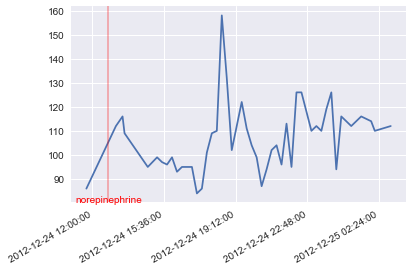

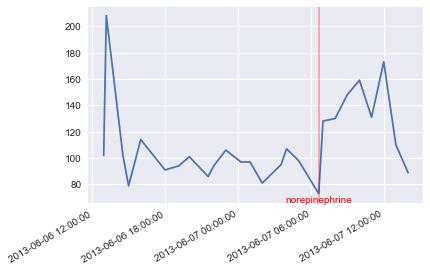

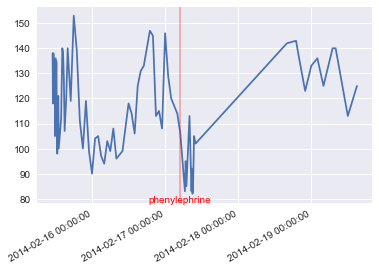

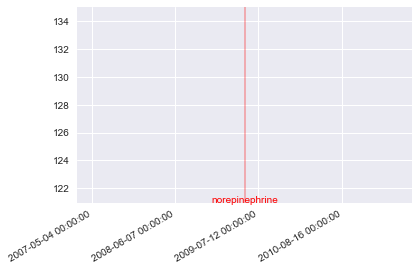

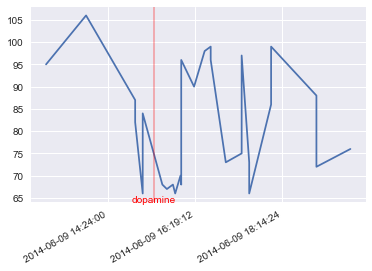

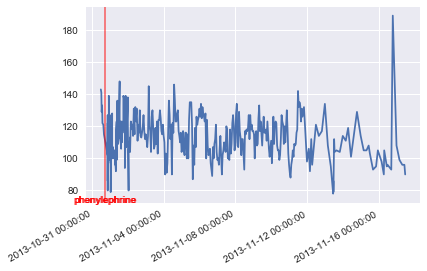

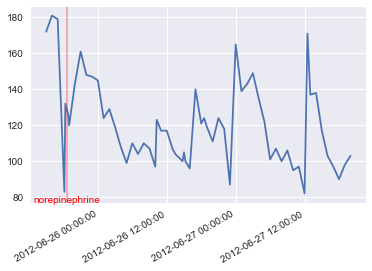

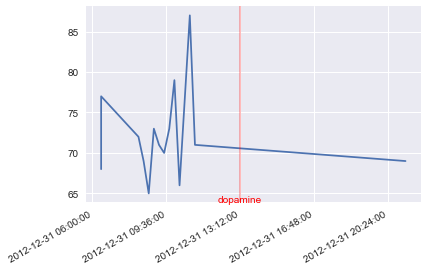

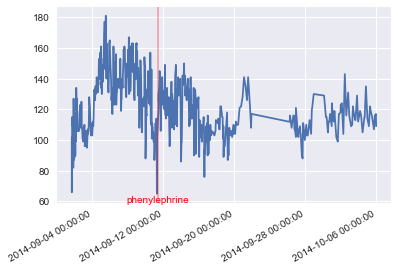

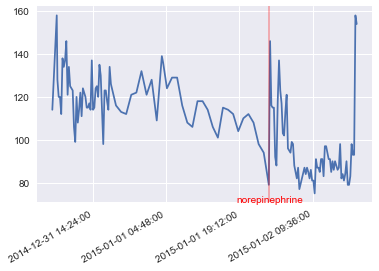

In [3]:
# Briefly look at the trend of blood pressure
sample_patient_sk = valid_pat_sk.sample(10)
for patient_sk in sample_patient_sk:
    sample_sysbp = Systolic_BP[Systolic_BP['PATIENT_SK'] == patient_sk]
    sample_med = one_type_treatment_valid_tcs[
        one_type_treatment_valid_tcs['PATIENT_SK'] == patient_sk]
    fig, ax = plt.subplots()
    ax.plot(sample_sysbp['EVENT_DATE'], sample_sysbp['RESULT_VALUE_NUM'])
    for i, val in enumerate(sample_med['MED_STARTED_DT_TM']):
        ax.axvline(x=sample_med['MED_STARTED_DT_TM'].iloc[i], alpha=0.3,
                   color='red')
        ax.text(sample_med['MED_STARTED_DT_TM'].iloc[i], ax.get_ylim()[0],
                sample_med['GENERIC_NAME'].iloc[i], ha='center', color='red')
        ax.xaxis.set_major_locator(plt.MaxNLocator(5))
        ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d %H:%M:%S'))
        ax.fmt_xdata = DateFormatter('%Y-%m-%d %H:%M:%S')
        fig.autofmt_xdate()

In [4]:

Systolic_BP['PATIENT_SK'].nunique()  # 2388
Diastolic_BP['PATIENT_SK'].nunique()  # 2390
patient_sk_overlap_indic1 = np.in1d(Systolic_BP['PATIENT_SK'].unique(),
                                    Diastolic_BP['PATIENT_SK'].unique())
sum(patient_sk_overlap_indic1)  # 2388
patient_sk_overlap_indic2 = np.in1d(Diastolic_BP['PATIENT_SK'].unique(),
                                    Systolic_BP['PATIENT_SK'].unique())
sum(patient_sk_overlap_indic2)  # 2388
not_overlap_patientsk = Diastolic_BP['PATIENT_SK'].unique()[
        ~patient_sk_overlap_indic2]
not_overlap_patientsk_detail = Diastolic_BP[Diastolic_BP['PATIENT_SK'].isin(
        not_overlap_patientsk)]

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\gzhu1\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotli

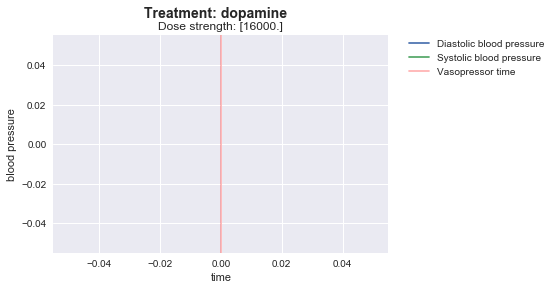

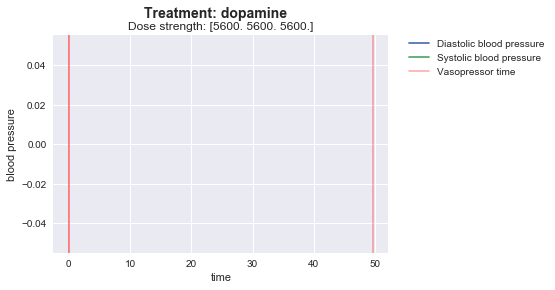

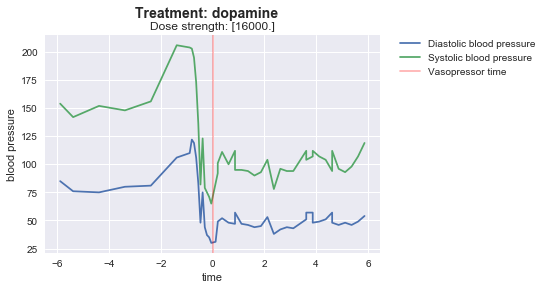

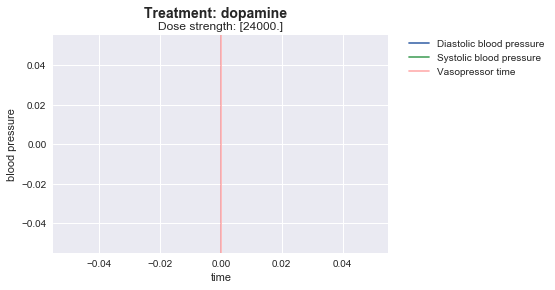

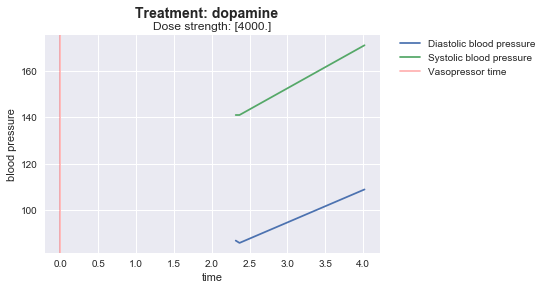

...

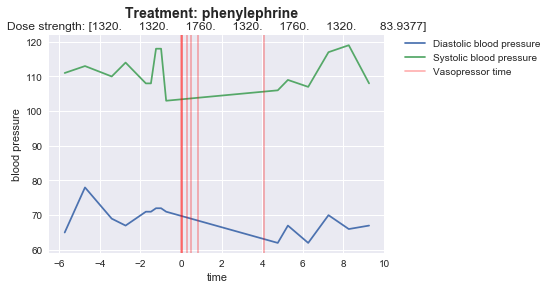

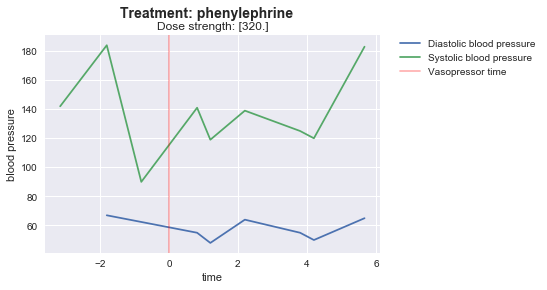

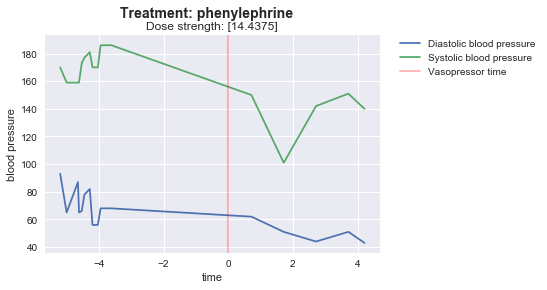

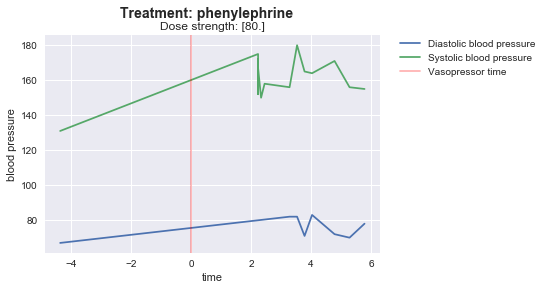

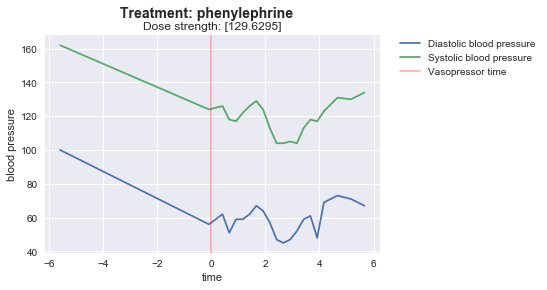

In [5]:
# Plot the figure
valid_med_df = one_type_treatment_valid_tcs[
        one_type_treatment_valid_tcs['PATIENT_SK'].isin(valid_pat_sk)]
valid_med_df.groupby('PATIENT_SK')['GENERIC_NAME'].unique().value_counts()
valid_med_df_grpby_treat = valid_med_df.groupby('GENERIC_NAME')
for treatment, data in valid_med_df_grpby_treat:
    for patient_sk in data['PATIENT_SK'].unique():
        sample_diasbp = Diastolic_BP[Diastolic_BP['PATIENT_SK'] == patient_sk]
        sample_sysbp = Systolic_BP[Systolic_BP['PATIENT_SK'] == patient_sk]
        sample_med = one_type_treatment_valid_tcs[
            one_type_treatment_valid_tcs['PATIENT_SK'] == patient_sk]
        # Convert the time as the time difference from the first event time
        time_diasbp = sample_diasbp['EVENT_DATE'] - sample_med[
                'MED_STARTED_DT_TM'].iloc[0]
        time_sysbp = sample_sysbp['EVENT_DATE'] - sample_med[
                'MED_STARTED_DT_TM'].iloc[0]
        time_med = sample_med['MED_STARTED_DT_TM'] - sample_med[
                'MED_STARTED_DT_TM'].iloc[0]
        # Convert the resolution of time from second to hour
        time_diasbp = time_diasbp.apply(total_seconds)/(60*60)
        time_sysbp = time_sysbp.apply(total_seconds)/(60*60)
        time_med = time_med.apply(total_seconds)/(60*60)
        # We care more about the time interval near the medication time
        threshold = 6
        time_interval_interested = [time_med.iloc[0]-threshold,
                                    time_med.iloc[-1]+threshold]
        time_interested_dias = pd.cut(time_diasbp, time_interval_interested)
        diasbp_interested = sample_diasbp[time_interested_dias.notnull()][
                'RESULT_VALUE_NUM']
        time_diasbp = time_diasbp[time_interested_dias.notnull()]
        time_interested_sys = pd.cut(time_sysbp, time_interval_interested)
        sysbp_interested = sample_sysbp[time_interested_sys.notnull()][
                'RESULT_VALUE_NUM']
        time_sysbp = time_sysbp[time_interested_sys.notnull()]
        fig, ax = plt.subplots()
        ax.plot(time_diasbp, diasbp_interested, label="Diastolic blood pressure")
        ax.plot(time_sysbp, sysbp_interested, label='Systolic blood pressure')
        for i, val in enumerate(sample_med['MED_STARTED_DT_TM']):
            if i == 0:
                ax.axvline(x=time_med.iloc[i], alpha=0.3, color='red',
                           label='Vasopressor time')
            else:
                ax.axvline(x=time_med.iloc[i], alpha=0.3, color='red')
    #        ax.text(time_med.iloc[i], ax.get_ylim()[0],
    #                sample_med['GENERIC_NAME'].iloc[i], ha='center', color='red')
    #        ax.text(time_med.iloc[i], ax.get_ylim()[1],
    #                "dose: {}" .format(
    #                      round(sample_med['TOTAL_CONSUMED_STRENGTH'].iloc[i], 2)),
    #                ha='center', color='red')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        fig.suptitle('Treatment: {}'.format(sample_med['GENERIC_NAME'].iloc[0]),
                     fontsize=14, fontweight='bold')
        ax.set_title('Dose strength: {}'.format(
                sample_med['TOTAL_CONSUMED_STRENGTH'].values))
        ax.set_xlabel('time')
        ax.set_ylabel('blood pressure')